# **Capstone Project - Finance and Risk Analytics**
---
## **<u>Problem Statement</u>**
> The given task is to provide consultation to two different investors, Mr Patrick Jyenger and Mr Peter Jyenger based on their requirements and financial objectives.

## **<u>Steps Performend</u>**
1. Importing Necessary Liberaries
2. Importing, Cleaning and Understanding Dataset
  * Importing Dataset (.csv file) to Dataframe
    * Merging all files to create a final dataframe
    * Creating a pivot table for visualization
    * Creating new column to understand Day-to-Day chnages in stocks
  * Cleaning dataframe
    * Replacing all NULL/NA values with 0 (as for stock analysis each and every data row of data is important)
    * Checking for abnormal data types for coulmns
3. Visualization
  * Visualization of stocks using Line Graph based on High of stocks
  * Visualization of stocks using Line Graph based on Cumulative Return of stocks
  * Visualization of stocks using Density Charts
  * Visualizing Trend Type of stocks using Candelstick
    * Uptrend
    * Downtrend
    * Sideways Trend
  * Visualizing correlation between stocks using Heatmap Subplots based on return
  * Visualzing stocks of different Industry uisng Pair plot based on Returns of each stocks
4. Profiling
  * Profile 1 -> Patrick
    * Creating new dataframe and finding Correlation between stocks using Heatmap
    * Calculating cumulative return of the stocks selected for Patrick
  * Profile 2 -> Peter
    * Creating new dataframe and finding Correlation between stocks using Heatmap for Peter
    * Calculating cumulative return of the stocks selected for Peter

---
# **Step 1: Importing Necessary Liberaries** 
---

In [1]:
import os
import warnings 
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly
import plotly.graph_objects as go

#import plotly.express as px


warnings.filterwarnings('ignore')

---
# **Step 2: Importing, Cleaning and Understanding Dataset**
---

## **2.1** Importing dataset to Dataframe

In [2]:
# Reading The DataSets
Annexure=pd.read_csv('input/Annexure-I.csv')
Annexure.loc[len(Annexure.index)] = [
    'S&P500', 'S&P500', 'S&P500']
Annexure['Ticker'] = Annexure['Ticker'].str.strip()

In [3]:
Annexure.head()

,Ticker,Industry,Company Name
0,AAL,Aviation,American Airlines Group Inc
1,ALGT,Aviation,Allegiant Travel Company
2,ALK,Aviation,Alaska Air Group Inc
3,DAL,Aviation,Delta Air Lines Inc
4,HA,Aviation,Hawaiian Holdings Inc


##### **Observations:**
* `annexure_df` contains all the Tickers (stock), Industry they belong to and their Company name

In [4]:
file_list = [os.path.join(root, name)

for root, dirs, files in os.walk('input') 
for name in files if name.endswith('.csv')]

file_list = [i for i in file_list if 'Annexure' not in i]

In [5]:
print(file_list)

['input/CS.csv', 'input/MRK.csv', 'input/HA.csv', 'input/DB.csv', 'input/AMZN.csv', 'input/MSFT.csv', 'input/ALGT.csv', 'input/FB.csv', 'input/IBM.csv', 'input/WFC.csv', 'input/GS.csv', 'input/BHC.csv', 'input/ALK.csv', 'input/AAL.csv', 'input/RHHBY.csv', 'input/GOOG.csv', 'input/PFE.csv', 'input/S&P500.csv', 'input/LUV.csv', 'input/MS.csv', 'input/DAL.csv', 'input/UNH.csv', 'input/AAPL.csv', 'input/JNJ.csv', 'input/BCS.csv']


In [6]:
df_list = []
for i in file_list:
    df = pd.read_csv(i).dropna(subset=['Date'])
    df['Date'] = pd.to_datetime(df['Date'], format='%d-%m-%Y')
    df = df.sort_values(by=['Date'])
    df['Ticker'] = i.split('/')[-1].replace('.csv', '')
    df['Prev Adj Close'] = df['Adj Close'].shift(1)
    df['Return'] = (df['Adj Close']/df['Prev Adj Close']) - 1
    df['Cumulative Return'] = (1+df['Return']).cumprod()
    del df['Prev Adj Close']
    df_list.append(
        df[['Date', 'Ticker', 
            'Open', 'High', 'Low', 'Close', 
            'Adj Close', 'Volume', 
            'Return', 'Cumulative Return']])

df = pd.concat(df_list)
df['Ticker'] = df['Ticker'].str.strip()

In [7]:
df.head()

,Date,Ticker,Open,High,Low,Close,Adj Close,Volume,Return,Cumulative Return
0,2010-01-04,CS,49.902344,51.035156,49.765625,50.771484,34.852165,734200.0,NaN,NaN
1,2010-01-05,CS,51.250000,51.318359,50.644531,51.191406,35.140423,447700.0,0.008271,1.008271
2,2010-01-06,CS,50.224609,50.917969,49.951172,50.478516,34.651054,751200.0,-0.013926,0.994230
3,2010-01-07,CS,51.250000,52.646484,51.201172,52.519531,36.052116,833700.0,0.040433,1.034430
4,2010-01-08,CS,52.548828,53.339844,52.441406,53.291016,36.581703,706900.0,0.014689,1.049625


In [8]:
df = pd.merge(
    df, Annexure[['Ticker', 'Industry']], 
    on='Ticker', how='left')

In [9]:
df.to_csv('input_data.csv', index=False)

In [10]:
df.head()

,Date,Ticker,Open,High,Low,Close,Adj Close,Volume,Return,Cumulative Return,Industry
0,2010-01-04,CS,49.902344,51.035156,49.765625,50.771484,34.852165,734200.0,NaN,NaN,Finance
1,2010-01-05,CS,51.250000,51.318359,50.644531,51.191406,35.140423,447700.0,0.008271,1.008271,Finance
2,2010-01-06,CS,50.224609,50.917969,49.951172,50.478516,34.651054,751200.0,-0.013926,0.994230,Finance
3,2010-01-07,CS,51.250000,52.646484,51.201172,52.519531,36.052116,833700.0,0.040433,1.034430,Finance
4,2010-01-08,CS,52.548828,53.339844,52.441406,53.291016,36.581703,706900.0,0.014689,1.049625,Finance


In [11]:
df = df.dropna()

In [12]:
#checking type of each column
df.dtypes

Date                 datetime64[ns]
Ticker                       object
Open                        float64
High                        float64
Low                         float64
Close                       float64
Adj Close                   float64
Volume                      float64
Return                      float64
Cumulative Return           float64
Industry                     object
dtype: object

---
# **Step 3: Visualization**
---

In [13]:
def get_industry_df(column_, industry_=None, ticker_list_=None):
    if industry_ is not None:
        ind_df = pd.pivot(
            df[df['Industry']==industry_][['Date', 'Ticker', column_]], 
            index='Date', columns='Ticker', values=column_)
    else:
        ind_df = pd.pivot(
            df[df['Ticker'].isin(ticker_list_)][['Date', 'Ticker', column_]], 
            index='Date', columns='Ticker', values=column_)
    ind_df.columns.name = None
    return ind_df

### **3.1** Visualzing stocks of different Industry uisng Line Charts based on High of each stocks


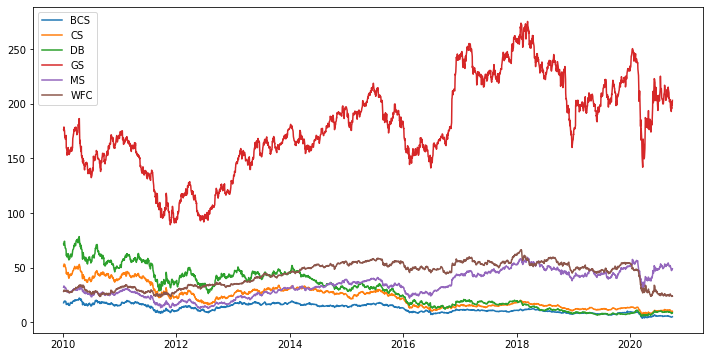

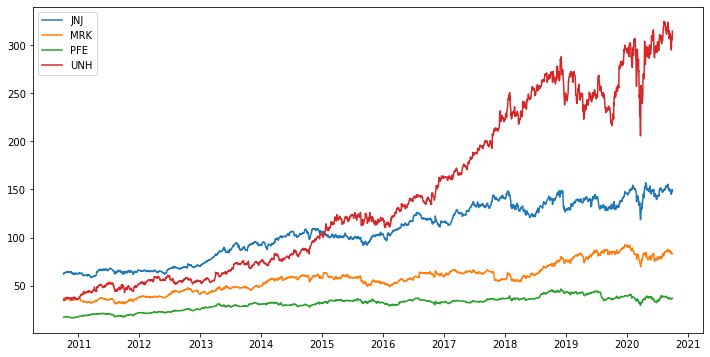

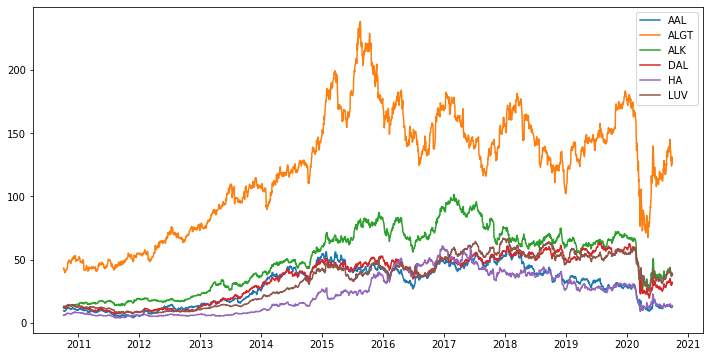

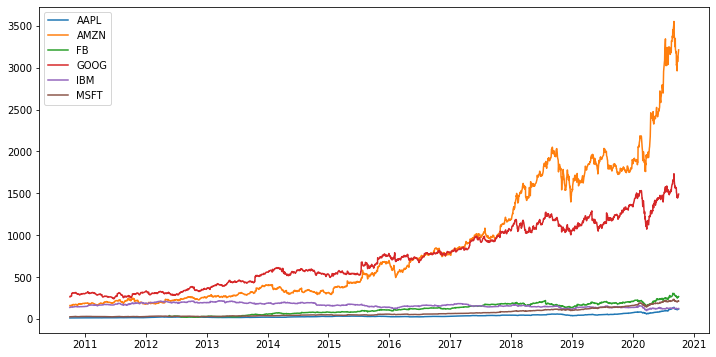

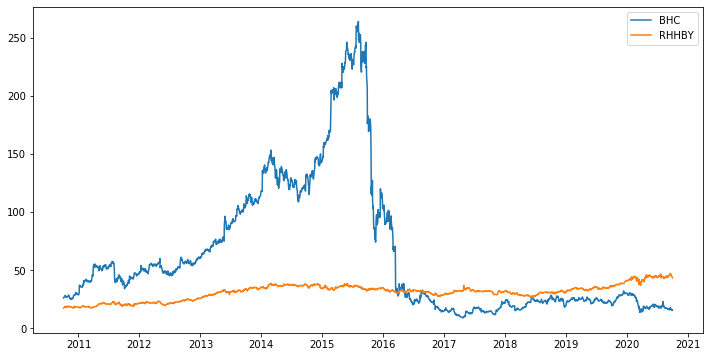

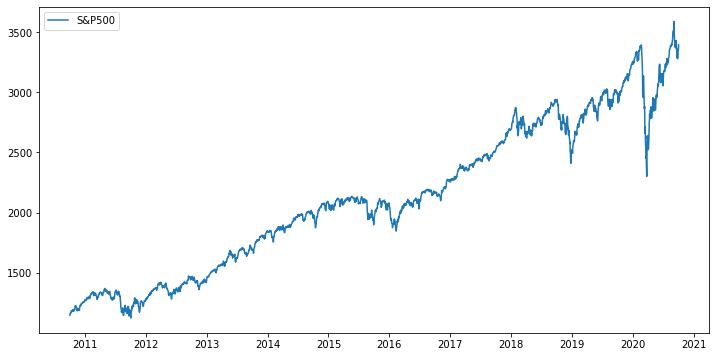

In [14]:

for i in df['Industry'].unique():
    ind_df = get_industry_df(
        industry_=i, column_='High')

    plt.figure(figsize=(12,6))
    plt.plot(ind_df)
    plt.legend(ind_df.columns.values)
    plt.show()

##### **Observations:**
1. By observing both High and Low price of tickers or stocks of different Industries over the period of 10 years we could conclude that
  * In Tech industry mentioned tickers have highest performance
    * AMZN
    * GOOG
  * In Finance industry mentioned tickers have highest performance
    * GS
  * In Aviation industry mentioned tickers have highest performance
    * ALGT
  * In Healthcare industry mentioned tickers have highest performance
    * UNH
    * JNJ
  * In Pharmaceuticals none of the tickers have performed well.

2. All the ticker belonging to different industries show a sudden dip in their performance in between the year 2020 to 2021.

3. The low performance of stocks after year 2020 must be due to the affect of Pandemic caused my the spread of COVID-19.

### **3.2** Plotting the line graphs for each industry based on Cumulative Return

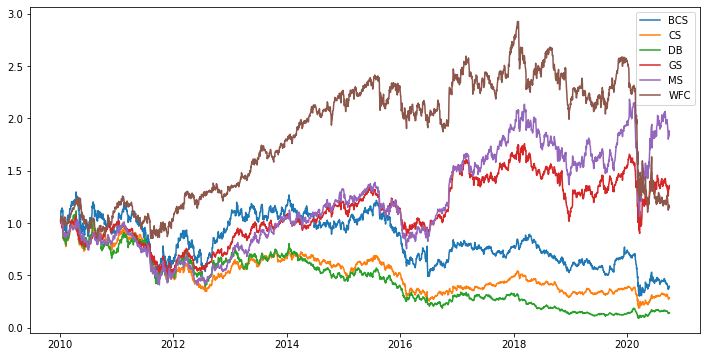

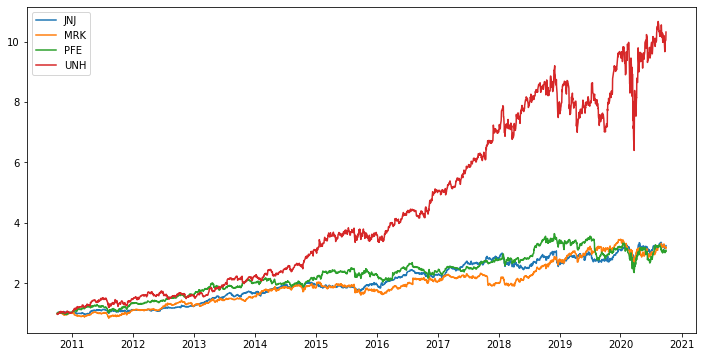

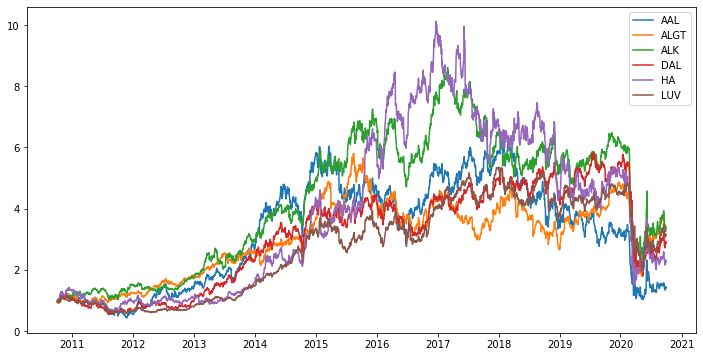

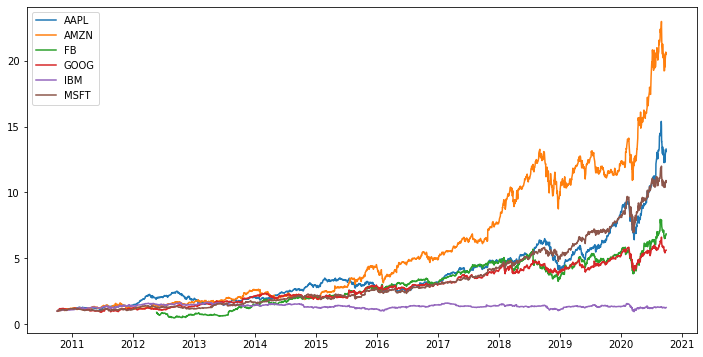

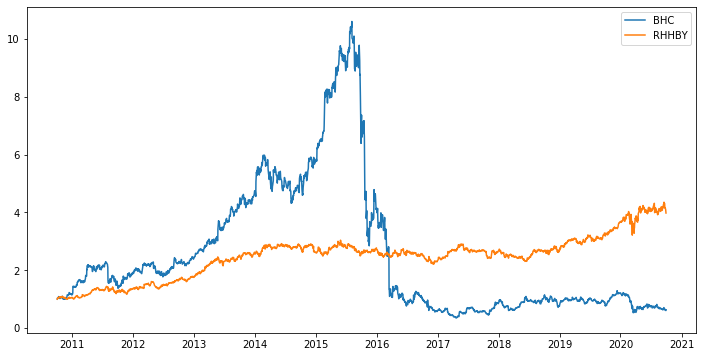

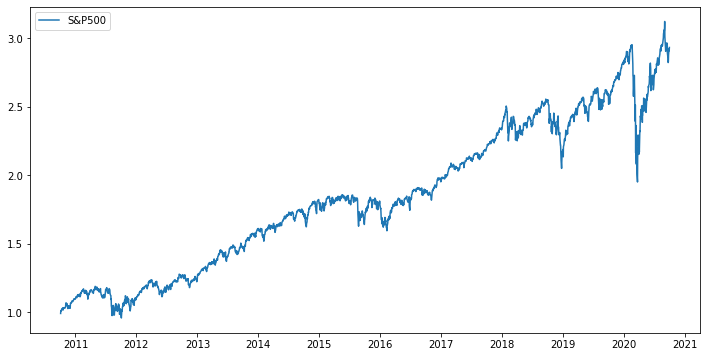

In [15]:
for i in df['Industry'].unique():
    ind_df = get_industry_df(
        industry_=i, column_='Cumulative Return')

    plt.figure(figsize=(12,6))
    plt.plot(ind_df)
    plt.legend(ind_df.columns.values)
    plt.show()

##### **Observations:**
1. We can see for Finance industry the Cumlative Return for the span of 10 years shows that stocks like `GS, MS and WFC` haven't performed well with cumlative return range between 1% to less than 3%.
2. In Aviation industry the cumlative return moves between 1% to 10% for span of a decade.
3. For Pharmaceuticals industry the cumlative return ranged from 1% to 10% till halve of 2015 but after sudden drop in other halve of 2015 it ranged from 1% to just 4%
4. Technology industry stocks have highest Cumlative return for last 10 years with range of 1 % to more than 25%, except the `IBM` stock with cumlative return of just 1% for 10 years. 
5. In Healthcare industry, the only well performning stock is `UNH` with cumlative range between 1% to more than 11% otherwise other stocks have cumlative range below 3%.

In [16]:
# Coeff variation - is reward to risk ratio , with least so worst stock 
# Std - more risky stock which has more std deviation 
technology_df = get_industry_df(industry_='Technology', column_='Return')
technology_desc_df = technology_df.describe().T
technology_desc_df['coef_variation'] = technology_desc_df['mean']/technology_desc_df['std']
technology_desc_df.T

,AAPL,AMZN,FB,GOOG,IBM,MSFT
count,2516.000000,2516.000000,2105.000000,2516.000000,2516.000000,2516.000000
mean,0.001185,0.001398,0.001189,0.000818,0.000189,0.001079
std,0.017705,0.019889,0.023569,0.016288,0.014110,0.016084
min,-0.128647,-0.126568,-0.189609,-0.111008,-0.128507,-0.147390
25%,-0.006920,-0.008133,-0.009159,-0.006431,-0.006049,-0.006575
50%,0.000923,0.001107,0.001077,0.000659,0.000424,0.000717
75%,0.010234,0.011457,0.012074,0.008646,0.006765,0.008773
max,0.119808,0.157457,0.296115,0.160524,0.113011,0.142169
coef_variation,0.066957,0.070270,0.050453,0.050194,0.013429,0.067072


##### **Observations:**
* Stocks like `AAPL, AMZN and MSFT` have high coef_variation. Hence, we can select these three for client who wants better risk adjusted returns
* If interested and looking future trends in above plots one could also be suggested to invest in `GOOG` stock.
* `IBM` shows low coef_variation as well as std, so this cannot be suggested for investment. Above plots also support these suggestions.

In [17]:
finance_df = get_industry_df(industry_='Finance', column_='Return')
finance_desc_df = finance_df.describe().T
finance_desc_df['coef_variation'] = finance_desc_df['mean']/finance_desc_df['std']
finance_desc_df.T

,BCS,CS,DB,GS,MS,WFC
count,2.704000e+03,2704.000000,2704.000000,2704.000000,2704.000000,2704.000000
mean,-8.157472e-07,-0.000212,-0.000370,0.000285,0.000488,0.000222
std,2.604356e-02,0.022302,0.026494,0.018517,0.022633,0.018308
min,-2.185185e-01,-0.182598,-0.174888,-0.127910,-0.156000,-0.158676
25%,-1.156143e-02,-0.010824,-0.014053,-0.008449,-0.010190,-0.007881
50%,0.000000e+00,0.000000,-0.000450,0.000517,0.000333,0.000195
75%,1.171940e-02,0.011011,0.013877,0.009549,0.011603,0.008221
max,1.794101e-01,0.163447,0.179507,0.175803,0.197700,0.145347
coef_variation,-3.132242e-05,-0.009511,-0.013973,0.015404,0.021578,0.012126


##### **Observations:**
1. In finance industry all the stocks show poor coef_variation and std values which says that though there is low risk in these stocks but the return from these will also be low or one could loss their investment.
2. Eventhough, client wants to invest on the assumption that they might improve well in future than stocks like `MS and GS` could be suggested as they have better coef_variation as compare to other stocks in this industry.

In [18]:
health_df = get_industry_df(industry_='Healthcare', column_='Return')
health_desc_df = health_df.describe().T
health_desc_df['coef_variation'] = health_desc_df['mean']/health_desc_df['std']
health_desc_df.T

,JNJ,MRK,PFE,UNH
count,2516.000000,2516.000000,2516.000000,2516.000000
mean,0.000526,0.000545,0.000527,0.001063
std,0.010811,0.013010,0.012563,0.016427
min,-0.100379,-0.088990,-0.077346,-0.172769
25%,-0.004142,-0.005909,-0.005514,-0.006734
50%,0.000444,0.000420,0.000300,0.001009
75%,0.005708,0.007384,0.006589,0.008619
max,0.079977,0.104080,0.089607,0.127989
coef_variation,0.048629,0.041883,0.041918,0.064717


##### **Observations:**
1. After visualizing and understanding Healthcare industry stocks on the basis of coef_variation values `JNJ and UNH` must suggested for the investment as these have high risk with high return in this industry stocks.
2. For client looking for low risk and good return stocks in Healthcare industry than `MRK and PFE` can be suggested to invest in for longer time.

In [19]:
aviation_df = get_industry_df(industry_='Aviation', column_='Return')
aviation_desc_df = aviation_df.describe().T
aviation_desc_df['coef_variation'] = aviation_desc_df['mean']/aviation_desc_df['std']
aviation_desc_df.T

,AAL,ALGT,ALK,DAL,HA,LUV
count,2516.000000,2516.000000,2516.000000,2516.000000,2516.000000,2516.000000
mean,0.000660,0.000775,0.000760,0.000747,0.000780,0.000663
std,0.032723,0.024578,0.023567,0.025529,0.030147,0.020477
min,-0.252246,-0.283300,-0.232385,-0.259924,-0.269722,-0.151094
25%,-0.014081,-0.009959,-0.010084,-0.011296,-0.013811,-0.009405
50%,0.000241,0.000528,0.000901,0.000822,0.000451,0.000937
75%,0.015593,0.012097,0.011674,0.012369,0.015337,0.010591
max,0.410970,0.292428,0.203079,0.210171,0.245837,0.144441
coef_variation,0.020176,0.031525,0.032238,0.029267,0.025871,0.032365


##### **Observations:**
1. Looking at the coef_variation values of stocks, clients willing to take less risk for sufficient return of investment must invest in these stocks.
2. Mostly, clien should invest in `ALK, ALGT and LUV` for sufficient return of investment. In such case investment should be for longer time.

In [20]:
pharmaceuticals_df = get_industry_df(industry_='Pharmaceuticals', column_='Return')
pharmaceuticals_desc_df = pharmaceuticals_df.describe().T
pharmaceuticals_desc_df['coef_variation'] = pharmaceuticals_desc_df['mean']/pharmaceuticals_desc_df['std']
pharmaceuticals_desc_df.T

,BHC,RHHBY
count,2516.000000,2516.000000
mean,0.000480,0.000637
std,0.035703,0.013274
min,-0.514629,-0.089609
25%,-0.013011,-0.006432
50%,0.000446,0.000389
75%,0.014987,0.007567
max,0.337444,0.130118
coef_variation,0.013442,0.047951


##### **Observations:**
1. Though there are only two stocks in Pharmaceuticals industry, if client wants to invest in the stocks of this industry than RHHBY must be choosed for investment, but std value also suggest that return could be low.
2. Being stock analyst, it is suggested not to invest in this industry stocks.

In [21]:
technology_df.head(10)

,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,
2010-10-04,-0.013733,0.010930,NaN,-0.006221,-0.002875,-0.019278
2010-10-05,0.036965,0.035266,NaN,0.030401,0.017819,0.018403
2010-10-06,0.000865,-0.034003,NaN,-0.007209,0.001308,0.003285
2010-10-07,0.000104,0.005599,NaN,-0.008122,0.006384,0.004093
2010-10-08,0.016769,-0.004607,NaN,0.011962,0.000937,0.001630
2010-10-11,0.004387,-0.016201,NaN,0.004643,0.005834,0.000814
2010-10-12,0.010766,0.022545,NaN,0.004732,0.001360,0.009760
2010-10-13,0.005359,-0.008372,NaN,0.003528,0.003718,0.020540
2010-10-14,0.007230,0.002320,NaN,-0.004362,0.008050,-0.004341


In [22]:
df[df['Industry']=='Technology']

,Date,Ticker,Open,High,Low,Close,Adj Close,Volume,Return,Cumulative Return,Industry
10445,2010-10-04,AMZN,153.949997,155.960007,152.789993,155.389999,155.389999,5346500.0,0.010930,1.010930,Technology
10446,2010-10-05,AMZN,157.080002,161.210007,157.009995,160.869995,160.869995,5620000.0,0.035266,1.046581,Technology
10447,2010-10-06,AMZN,160.600006,160.679993,154.600006,155.399994,155.399994,6060800.0,-0.034003,1.010995,Technology
10448,2010-10-07,AMZN,156.509995,157.399994,153.389999,156.270004,156.270004,4622000.0,0.005599,1.016655,Technology
10449,2010-10-08,AMZN,155.179993,156.279999,152.779999,155.550003,155.550003,6918400.0,-0.004607,1.011971,Technology
...,...,...,...,...,...,...,...,...,...,...,...
58415,2020-09-24,AAPL,105.169998,110.250000,105.000000,108.220001,108.220001,167743300.0,0.010269,12.411742,Technology
58416,2020-09-25,AAPL,108.430000,112.440002,107.669998,112.279999,112.279999,149981400.0,0.037516,12.877383,Technology
58417,2020-09-28,AAPL,115.010002,115.320000,112.779999,114.959999,114.959999,137672400.0,0.023869,13.184752,Technology
58418,2020-09-29,AAPL,114.550003,115.309998,113.570000,114.089996,114.089996,99382200.0,-0.007568,13.084971,Technology


### **3.3** Visualzing stocks of different Industry uisng Density Charts

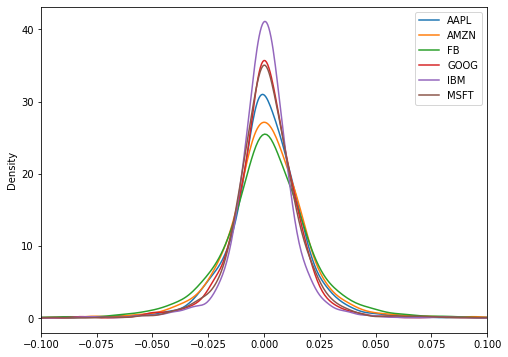

In [23]:
# Plotting The Density Chart of Technology - Return Distribution , Amazon Dont have Fat tails as compared to FaceBook
technology_df.plot.kde(figsize = (8, 6))
plt.xlim(left=-0.1, right=0.1)
plt.show()

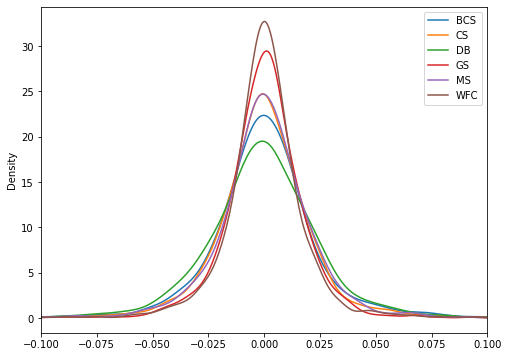

In [24]:
# Plotting The Density Chart of Finance
finance_df.plot.kde(figsize = (8, 6))
plt.xlim(left=-0.1, right=0.1)
plt.show()

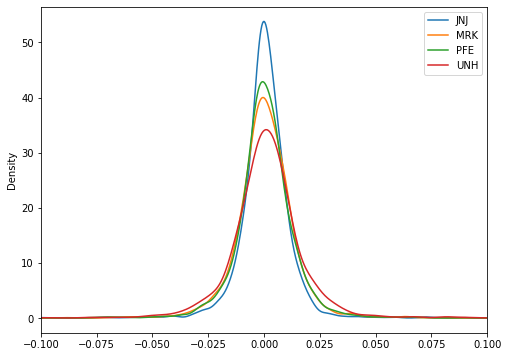

In [25]:
# Plotting The Density Chart of Health
health_df.plot.kde(figsize = (8, 6))
plt.xlim(left=-0.1, right=0.1)
plt.show()

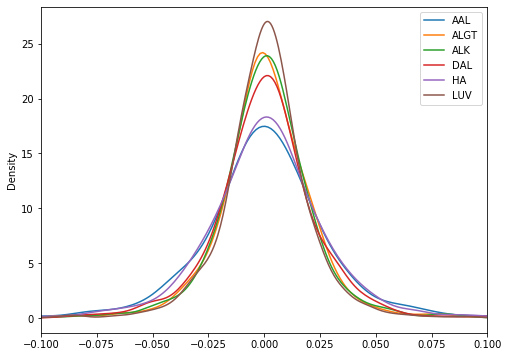

In [26]:
# Plotting The Density Chart of Aviation
aviation_df.plot.kde(figsize = (8, 6))
plt.xlim(left=-0.1, right=0.1)
plt.show()

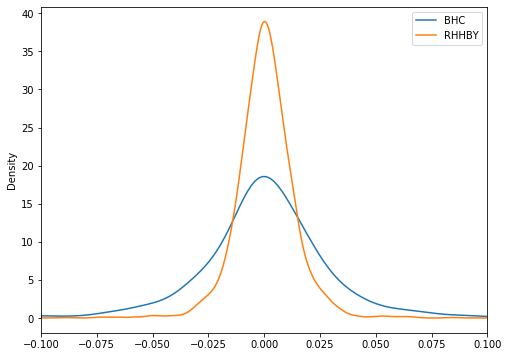

In [27]:
# Plotting The Density Chart of Pharmaceuticals 
pharmaceuticals_df.plot.kde(figsize = (8, 6))
plt.xlim(left=-0.1, right=0.1)
plt.show()

### **3.4** Visualizing Trend Type of stocks using Candelstick
* Uptrend
* Downtrend
* Sideways Trend 

#### **3.4.1** Technology

In [28]:
Technology_df = df[df['Industry']=='Technology']

candleFig = go.Figure(data=[go.Candlestick(x=Technology_df['Date'],
                                           open=Technology_df['Open'],
                                           high=Technology_df['High'],
                                           low=Technology_df['Low'],
                                           close=Technology_df['Close'])
])
candleFig.update_layout(xaxis_rangeslider_visible=False, showlegend=True, xaxis_title='Year', yaxis_title='Stock Price')
candleFig.show()

#### **3.4.2** Finance

In [29]:
Finance_df = df[df['Industry']=='Finance']

candleFig = go.Figure(data=[go.Candlestick(x=Finance_df['Date'],
                                           open=Finance_df['Open'],
                                           high=Finance_df['High'],
                                           low=Finance_df['Low'],
                                           close=Finance_df['Close'])
])
candleFig.update_layout(xaxis_rangeslider_visible=False, showlegend=True, xaxis_title='Year', yaxis_title='Stock Price')
candleFig.show()

#### **3.4.3** Aviation

In [30]:
Aviation_df = df[df['Industry']=='Aviation']

candleFig = go.Figure(data=[go.Candlestick(x=Aviation_df['Date'],
                                           open=Aviation_df['Open'],
                                           high=Aviation_df['High'],
                                           low=Aviation_df['Low'],
                                           close=Aviation_df['Close'])
])
candleFig.update_layout(xaxis_rangeslider_visible=False, showlegend=True, xaxis_title='Year', yaxis_title='Stock Price')
candleFig.show()

#### **3.4.4** Health Care

In [31]:
Healthcare_df = df[df['Industry']=='Healthcare']

candleFig = go.Figure(data=[go.Candlestick(x=Healthcare_df['Date'],
                                           open=Healthcare_df['Open'],
                                           high=Healthcare_df['High'],
                                           low=Healthcare_df['Low'],
                                           close=Healthcare_df['Close'])
])
candleFig.update_layout(xaxis_rangeslider_visible=False, showlegend=True, xaxis_title='Year', yaxis_title='Stock Price')
candleFig.show()

#### **3.4.5** Pharmaceuticals

In [32]:
Pharmaceutical_df = df[df['Industry']=='Pharmaceuticals']

candleFig = go.Figure(data=[go.Candlestick(x=Pharmaceutical_df['Date'],
                                           open=Pharmaceutical_df['Open'],
                                           high=Pharmaceutical_df['High'],
                                           low=Pharmaceutical_df['Low'],
                                           close=Pharmaceutical_df['Close'])
])
candleFig.update_layout(xaxis_rangeslider_visible=False, showlegend=True, xaxis_title='Year', yaxis_title='Stock Price')
candleFig.show()

* `coef_variation or Coefficient of Variation` represents the risk ratio mean and Std Deviation of daily returns i.e. stock with least coef_variation value has low risk and hence has low return or is a worst stock. But stocks having high coef_variation value implies high risk with high return value or is a best performing stock.

* `std or Standard Deviation` more risky stocks will have more std values while stocks with less risk will have less std values.

In [33]:
df['Industry'].unique()

array(['Finance', 'Healthcare', 'Aviation', 'Technology',
       'Pharmaceuticals', 'S&P500'], dtype=object)

In [34]:
df.head()

,Date,Ticker,Open,High,Low,Close,Adj Close,Volume,Return,Cumulative Return,Industry
1,2010-01-05,CS,51.250000,51.318359,50.644531,51.191406,35.140423,447700.0,0.008271,1.008271,Finance
2,2010-01-06,CS,50.224609,50.917969,49.951172,50.478516,34.651054,751200.0,-0.013926,0.994230,Finance
3,2010-01-07,CS,51.250000,52.646484,51.201172,52.519531,36.052116,833700.0,0.040433,1.034430,Finance
4,2010-01-08,CS,52.548828,53.339844,52.441406,53.291016,36.581703,706900.0,0.014689,1.049625,Finance
5,2010-01-11,CS,52.949219,53.046875,52.509766,52.812500,36.253220,537700.0,-0.008979,1.040200,Finance


### **3.5** Visualizing correlation between stocks using Heatmap Subplots based on return

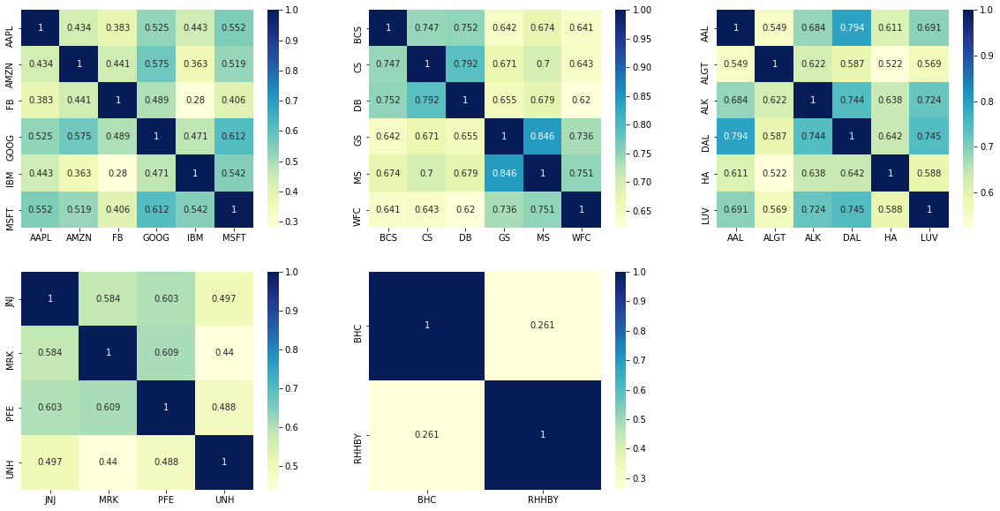

In [35]:
# Plotting The Heatmap for the Co-Relation
fig, ax = plt.subplots(2,3, figsize=(20,10))

# Tech Industry Heatmap
sns.heatmap(technology_df.corr(),annot=True,fmt=".3g",cmap='YlGnBu', ax=ax[0][0])
# Finance Industry Heatmap
sns.heatmap(finance_df.corr(),annot=True,fmt=".3g",cmap='YlGnBu',ax=ax[0][1])
# Aviation Industry Heatmap
sns.heatmap(aviation_df.corr(),annot=True,fmt=".3g",cmap='YlGnBu', ax=ax[0][2])
# Heathcare Industry Heatmap
sns.heatmap(health_df.corr(),annot=True,fmt=".3g",cmap='YlGnBu',ax=ax[1][0])
# Pharmaceuticals Industry Heatmap
sns.heatmap(pharmaceuticals_df.corr(),annot=True,fmt=".3g",cmap='YlGnBu',ax=ax[1][1])

fig.delaxes(ax[1][2])
# fig.subplots_adjust(left=-3.3,
#                     bottom=-0.3, 
#                     right=0.9, 
#                     top=0.9, 
#                     wspace=0.4, 
#                     hspace=0.4)
plt.show()

##### **Observations:**
1. For Technology industry below mentioned stocks have high correlation and combined can give high returns.
  * MSFT-AAPL, MSFT-AMZN, MSFT-GOOG, MSFT-IBM
  * GOOG-AAPL, GOOG-AMZN

2. For Finance industry below mentioned stocks have high correlation and combined can give high returns.
  * DB-CS-BCS
  * GS-MS-WFC

3. For Aviantion industry below mentioned stocks have high correlation and combined can give high returns.
  * AAL-DAL, AAL-LUV
  * ALK-LUV, ALK-AAL, ALK-DAL
  * DAL-LUV

4. For Healthcare industry below mentioned stocks have high correlation and combined can give high returns.
  * PFE-JNJ-MRK

5. In Pharmaceuticals there seems to be no correlation between any stock. Hence, not recommended to invest in any stocks of this industry.

#### **NOTE - Two stocks that are highly correlated, among both investing in any one is suggested as they both have same return pattern**

##### **Observations:**
1. Conclusion from correlation heatmaps
2. Google and msft are the highest of correlation 
3. So we can invest in whichever has the better coefficient of variation
4. If correlation is high we need not invest in both the stocks because they are moving similarly
5. Pick up single stock from each industry make correlation matrix - heatmap which have high return 

##### **Observations:**
1. BCS, CS and DB  are highly correlated, so only need to invest in one of these three
2. GS, MS, WFC are highly correlated,so only need to invest in one of these three 
3. High risk and high return give more stocks of higher coefficient of variation and higher mean return 
4. LH LR low stdv 
5. low coff bad stock nobody should invest 

### **3.6** Visualzing stocks of different Industry uisng Pair plot based on Returns of each stocks

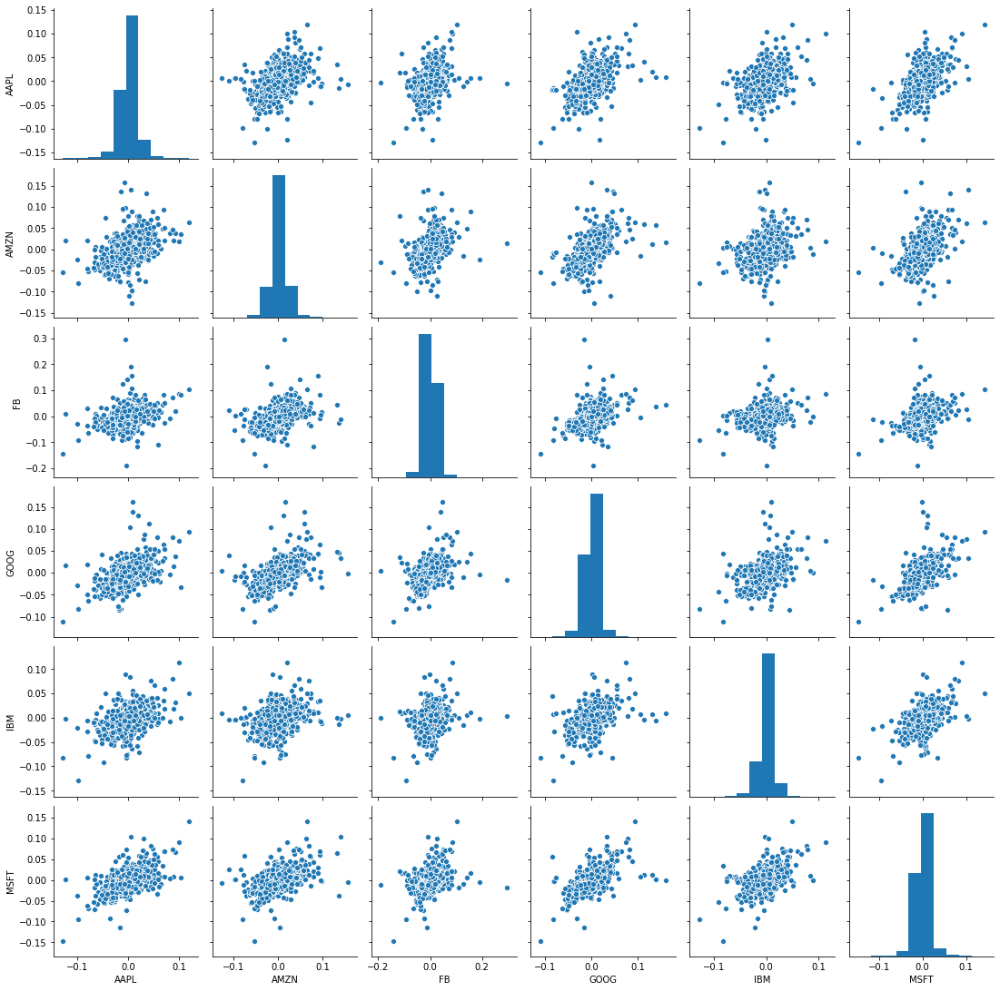

In [36]:
# Plotting Industry wise Pairplot
sns.pairplot(data=technology_df)
plt.show()

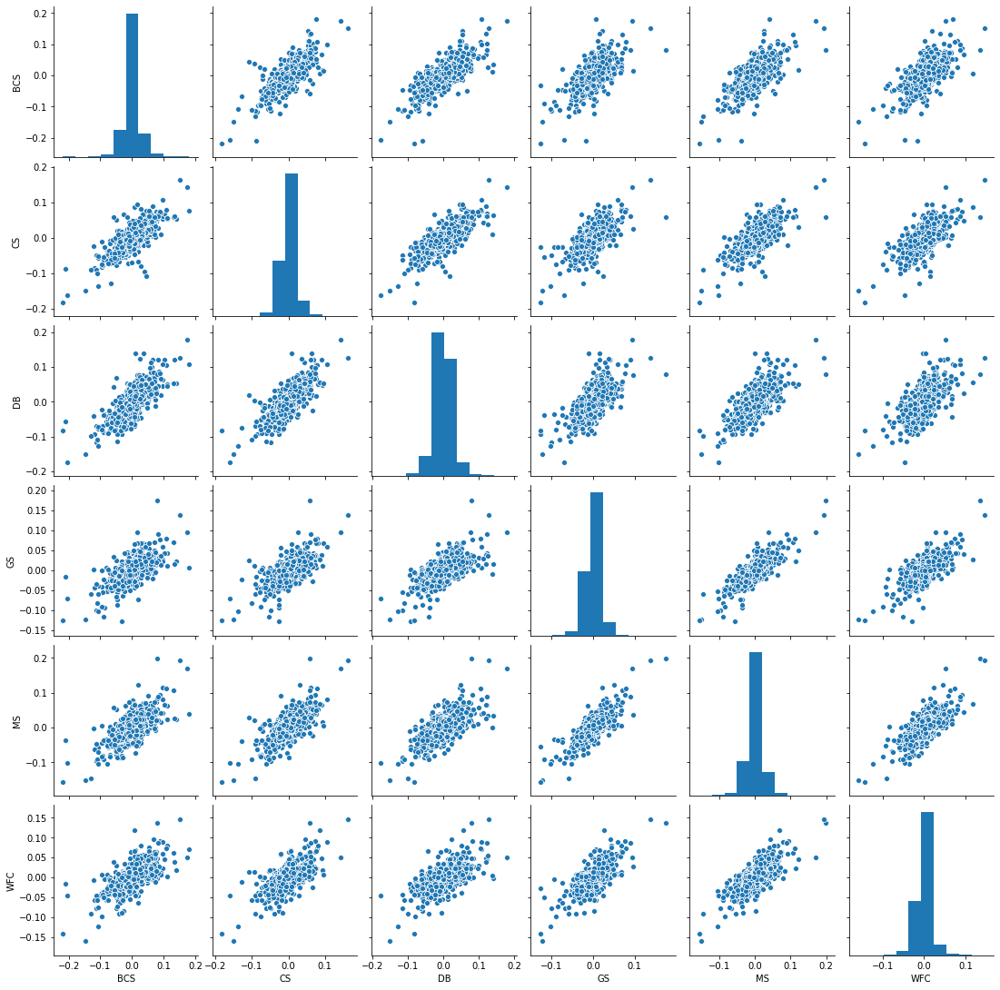

In [37]:
sns.pairplot(data=finance_df)
plt.show()

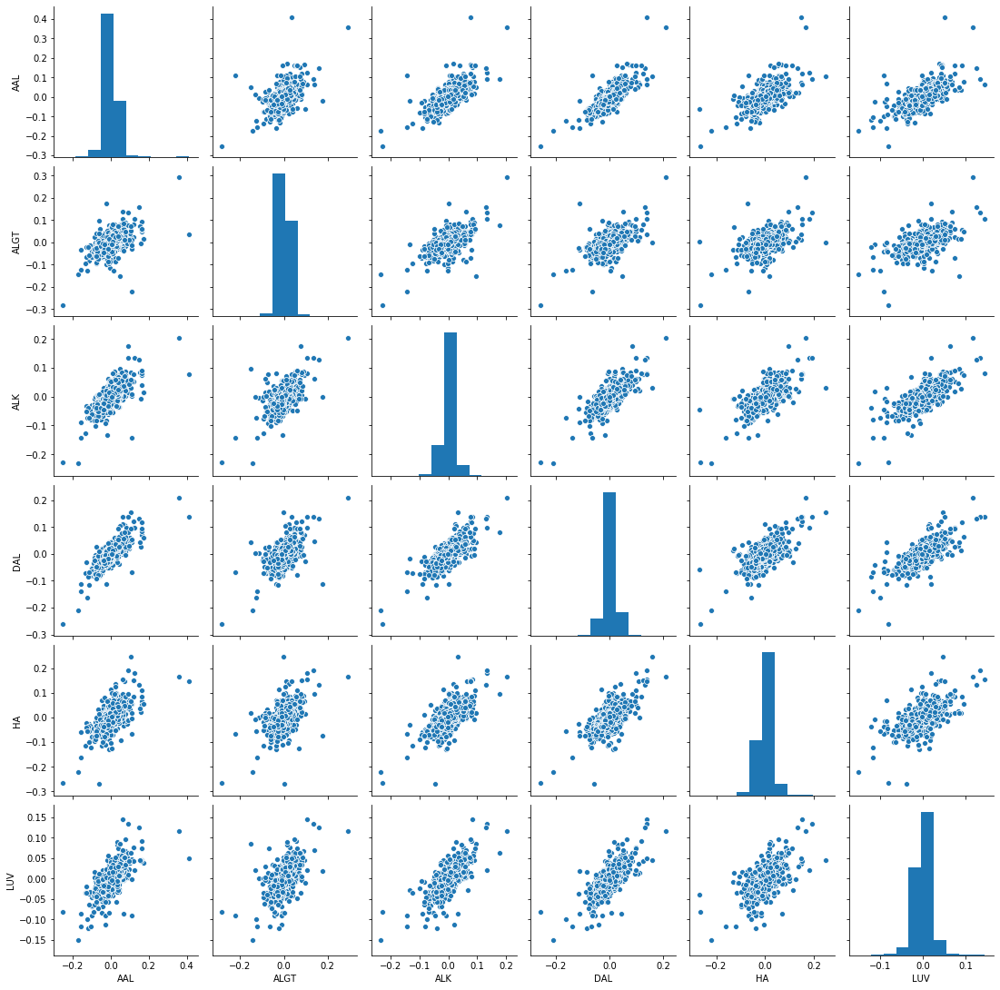

In [38]:
sns.pairplot(data=aviation_df)
plt.show()

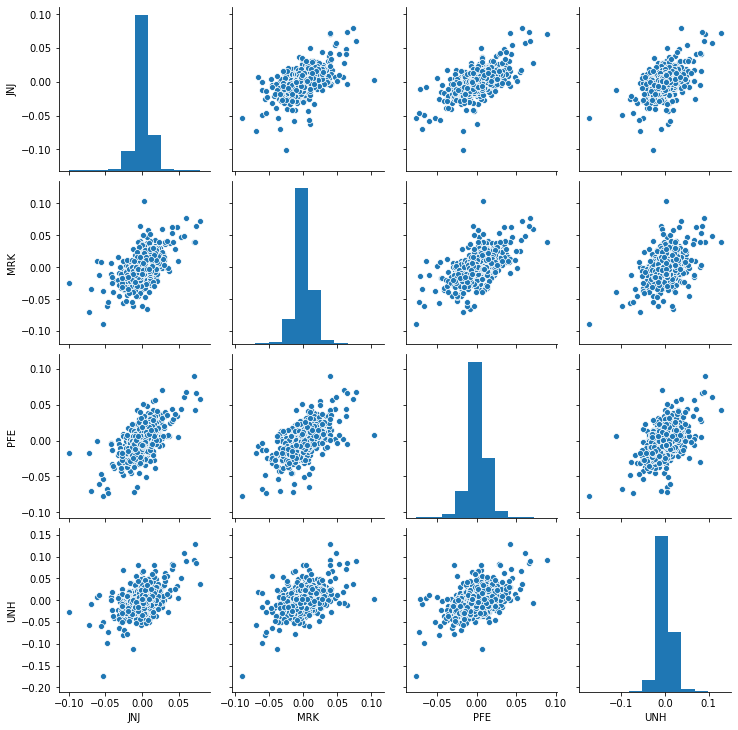

In [39]:
sns.pairplot(data=health_df)
plt.show()

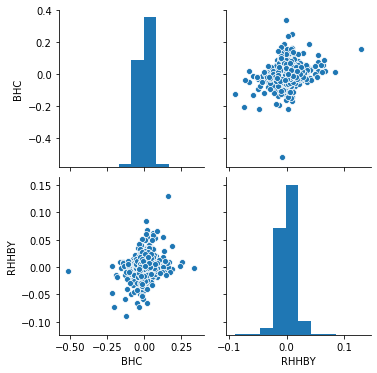

In [40]:
sns.pairplot(data=pharmaceuticals_df)
plt.show()

# **Step 4: Profiling**

## **4.1** Profile 1 -> Patrick
* On the basis of understanding we have collected after performing all the above steps, we are building Profile 1 for `Patrick`.
  * Patrick is looking for decent standard living post retirement 
  * He is looking to invest in such stocks those have low risk and have high or good return.

In [41]:
# cumulating all the stocks best for Patrick into new dataframe
portfolio1_df=get_industry_df(
    ticker_list_=['AMZN', 'MSFT','AAPL', 
                  'JNJ', 'UNH', 
                  'LUV'], 
    column_='Return')

### **4.1.1** Creating new dataframe and finding Correlation between stocks using Heatmap

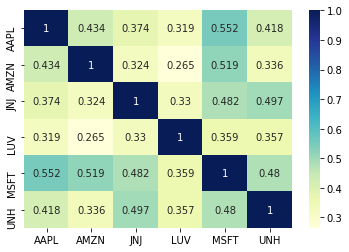

In [42]:
# plotting correlation between stocks with Heatmap
sns.heatmap(portfolio1_df.corr(),annot=True,fmt=".3g",cmap='YlGnBu')
plt.show()

##### **Obsertavtions:**
1. MSFT stock seems to highly coorelated with AAPL and AMZN so we could drop either of the stocks.
2. In this we are going to drop MSFT as it low return and cumulative return when campared with AAPL and AMZN stocks.

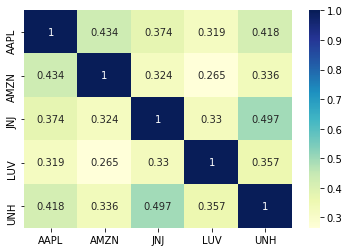

In [43]:
# creating new dataframe without MSFT in it
portfolio1_df=get_industry_df(
    ticker_list_=['AMZN','AAPL', 
                  'JNJ', 'UNH', 
                  'LUV'], 
    column_='Return')
# plotting correlation between stocks with Heatmap
sns.heatmap(portfolio1_df.corr(),annot=True,fmt=".3g",cmap='YlGnBu')
plt.show()

##### **Observations:**
* Now, all the stocks seems to be properly diversified and this is an optimum portfolio for Patrick to invest in.

### **4.1.2** Calculating cumulative return of the stocks selected for Patrick
* Cumulative return over period of 10 years
* Cumulative return over period of 5 years

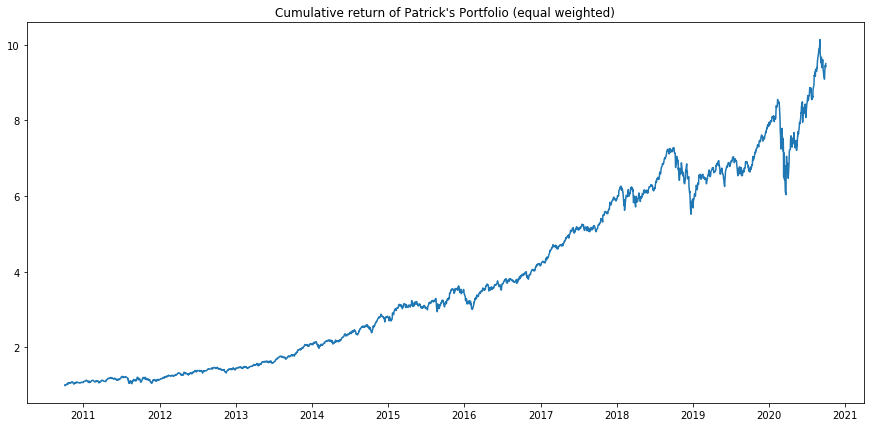

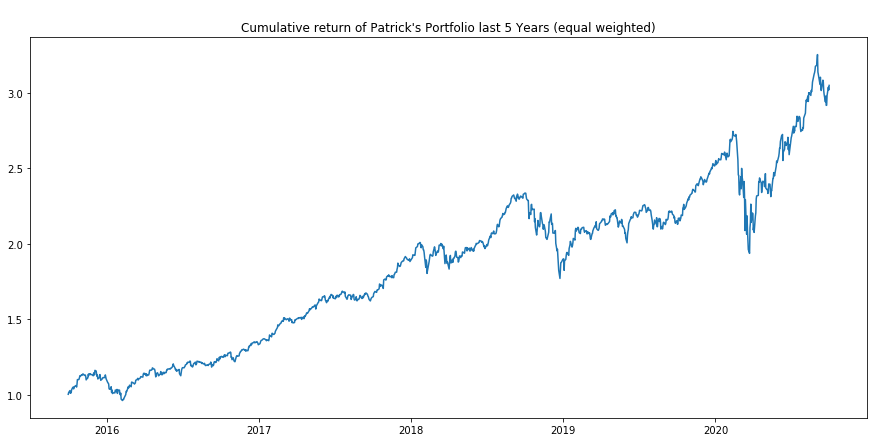

In [44]:
# calculating number of cloumns
l1 = len(portfolio1_df.columns.values)
weights1 = [1/l1 for i in range(l1)]
cumulative_portfolio1_df = pd.DataFrame(
    (1+portfolio1_df.multiply(weights1, axis=1)\
                     .sum(axis=1))\
    .cumprod())

# calculating cumulative return of stocks for Patrick over period of 10 years
cumulative_portfolio1_df_5yrs = pd.DataFrame(
    (1+portfolio1_df.loc['2015-10-01':].multiply(weights1, axis=1)\
                     .sum(axis=1))\
    .cumprod())

# plotting cumulative return of stocks for Patrick over period of 10 years
plt.figure(figsize=(15,7))
plt.plot(cumulative_portfolio1_df)
plt.title("Cumulative return of Patrick's Portfolio (equal weighted)")
plt.show()

# plotting cumulative return of stocks for Patrick over period of 10 years
plt.figure(figsize=(15,7))
plt.plot(cumulative_portfolio1_df_5yrs)
plt.title("\nCumulative return of Patrick's Portfolio last 5 Years (equal weighted)")
plt.show()

##### **Observations:**
1. Patrick - low risk consservative, wants a good retirement life
2. Since patrick prefers less risk and consistent returns we will select stocks which have less volatility(std)
3. We will also diversify our portfolio to all sectors so that we dont have all our eggs in one basket
4. Technology - Amazon, Microsoft and Apple will be considered
5. Amazon has the best reward to risk ratio and Microsoft is the second best and Apple is third
6. Health - JNJ & UNH will be considered 
7. Avaition - LUV & ALK, but since they are very much correlated, we will skip ALK and consider only LUV
8. Finance & Pharms - No stocks are being considered because of not satisfactorty performance 

## **4.2** Profile 2 -> Peter
* On the basis of understanding we have collected after performing all the above steps, we are building 2nd Profile for `Peter`(son of Patrick).
  * Peter is looking for investing in high risk and high return providing stocks. 
  * He is willing to investe in stocks having high risk and providing high return of investment.

### **4.2.1** Creating new dataframe and finding correlation between stocks using Heatmap

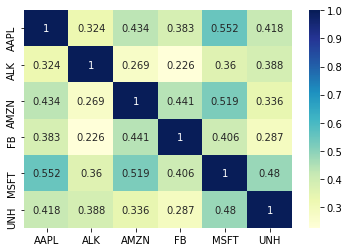

In [45]:
portfolio2_df=get_industry_df(
    ticker_list_=['AMZN','AAPL','MSFT','FB',
                   'UNH', 
                  'ALK'], 
    column_='Return')

sns.heatmap(portfolio2_df.corr(),annot=True,fmt=".3g",cmap='YlGnBu')
plt.show()

##### **Observations:**
* All the stocks seems to be properly diversified and this is an optimum portfolio for Peter to invest in.

### **4.2.2** Calculating cumulative return of the stocks selected for Peter
* Cumulative return over period of 10 years
* Cumulative return over period of 5 years

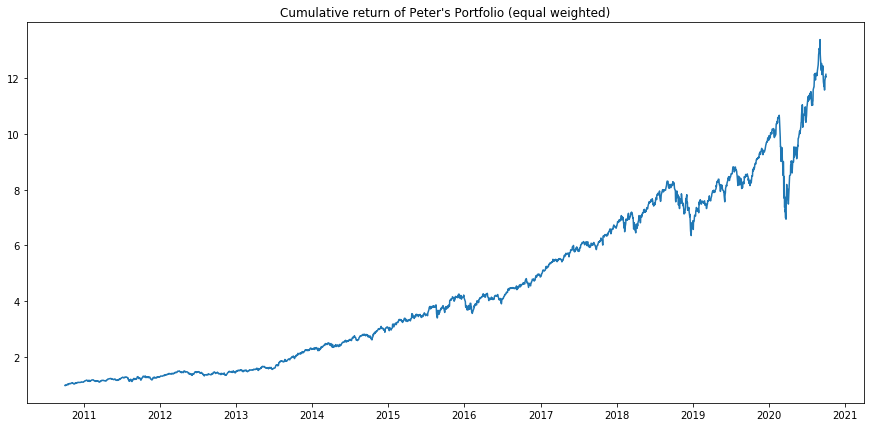

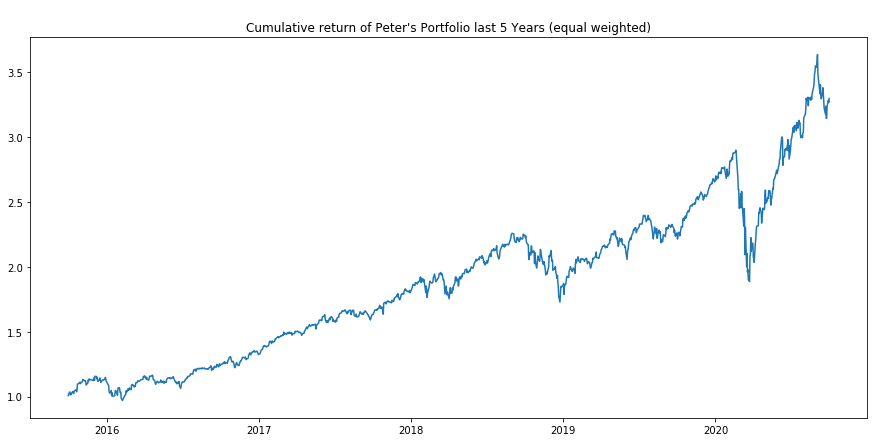

In [46]:
# calculating number of cloumns
l2 = len(portfolio2_df.columns.values)
weights2 = [1/l2 for i in range(l2)]

# calculating cumulative return of stocks for Peter over period of 10 years
cumulative_portfolio2_df = pd.DataFrame(
    (1+portfolio2_df.multiply(weights2, axis=1)\
                     .sum(axis=1))\
    .cumprod())

# calculating cumulative return of stocks for Peter over period of 5 years
cumulative_portfolio2_df_5yrs = pd.DataFrame(
    (1+portfolio2_df.loc['2015-10-01':].multiply(weights2, axis=1)\
                     .sum(axis=1))\
    .cumprod())

# plotting cumulative return of stocks for Peter over period of 10 years
plt.figure(figsize=(15,7))
plt.plot(cumulative_portfolio2_df)
plt.title("Cumulative return of Peter's Portfolio (equal weighted)")
plt.show()

# plotting cumulative return of stocks for Peter over period of 5 years
plt.figure(figsize=(15,7))
plt.plot(cumulative_portfolio2_df_5yrs)
plt.title("\nCumulative return of Peter's Portfolio last 5 Years (equal weighted)")
plt.show()

##### **Observations:**
1. Since peter wants high returns and is willing to take high risks we can select 
2. stocks which are giving superior returns 
3. Even though we will do portfolio diversification but we will not be as strict as it was in the case of patrick
4. here we can afford to have less restriction on correlation, but we will still be a little careful 

5. Technology - almost all tech stocks are really having good cumulative returns so we will select, 
6.     - we will select, AMZN, AAPL, MSFT, FB
7. Health - UNH will be considered 
8. Avaition - ALK,
9. Finance & Pharms - No stocks are being considered because of not satisfactorty performance 

##### **Observations:**
1. Both plots in 4.2.2 show that stocks can provide high return.
2. Statistical view confirms that all these stock have high coef_variation that means these stocks could 
   provide high return on investment, but high std means they also have high risk associated with them.
3. Based on the plotting and statstical represntation in 4.1.2 and 4.1.3 we could conclude these are the best 
   for the Patrick and clients having similar profile.
4. A dip after 2020 could be due to spread of Pandemic affecting closing of various
   bussinesses all over the World. 

##### **Observations:**
1. Drop after covid is more drastic in Peters Case becasue he was investing in more risky portfolio. 
2.  End value of Peters portfolio is also higher than patricks but the returns of peters portfolio are more volatile.


 **Note:** Stocks for Pharmaceuticals and Healthcare have not been included/considered because of their low return and high risk condition.
